In [41]:
using Pkg
Pkg.add("Images")
Pkg.add("TestImages")
Pkg.add("Plots")
Pkg.add("LinearAlgebra")
using Plots, TestImages, Images
include("../src/KelvinletsImage.jl")

 Resolving package versions...
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Project.toml`
 [no changes]
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Project.toml`
 [no changes]
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Project.toml`
 [no changes]
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Project.toml`
 [no changes]
  Updating `~/Desktop/Kelvinlets/KelvinletsImage.jl/Manifest.toml`
 [no changes]


Main.KelvinletsImage

In [42]:
img = testimage("mandrill")
obj = KelvinletsImage.KelvinletsObject(img, 0.4, 1.0)
grid = load("../testImages/grid.jpg")
gridObj = KelvinletsImage.KelvinletsObject(grid, 0.4, 1.0)

Main.KelvinletsImage.KelvinletsObject(0.07957747154594767, 0.033157279810811534, 11.599726720946931, 512, 512, RGB{Normed{UInt8,8}}[RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0) … RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0); RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0) … RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0); … ; RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0) … RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0); RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0) … RGB{N0f8}(1.0,1.0,1.0) RGB{N0f8}(1.0,1.0,1.0)])

# Applying a Regular Area Deformation

Simply dividing the image into a *3x3* GRID, where each block is deformed by an edge or a set of border pixels.

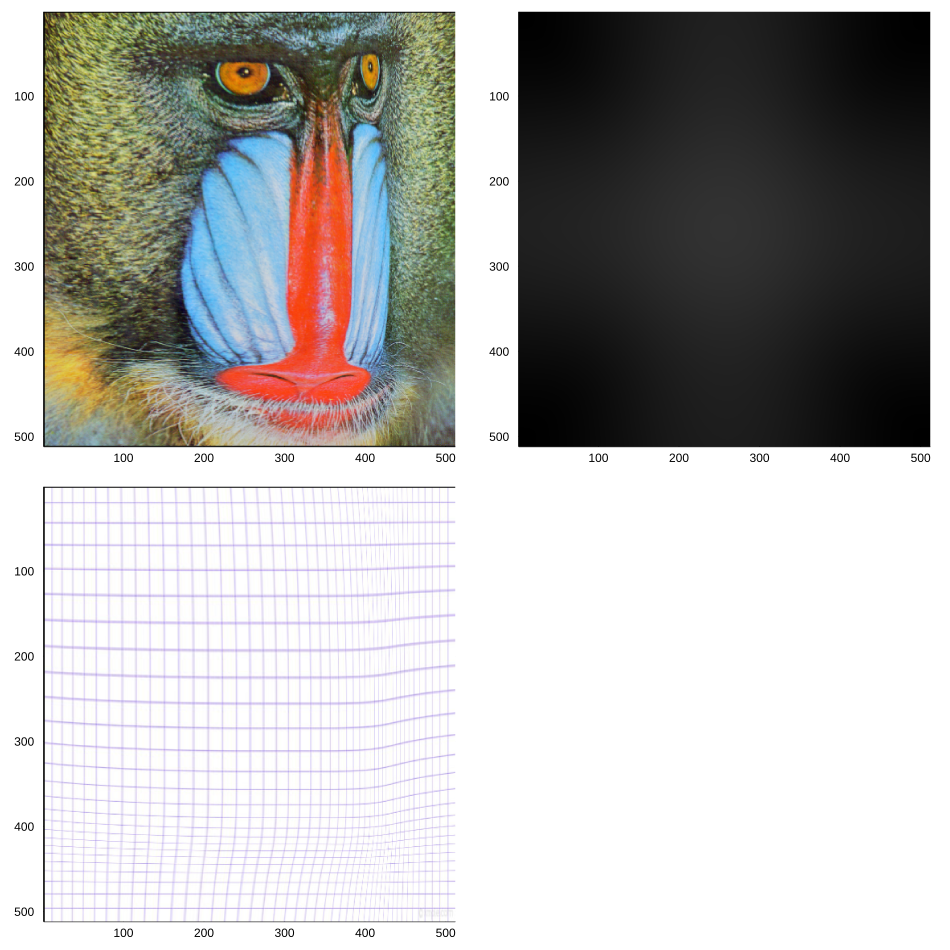

In [37]:
newImageAreaVar = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 500., KelvinletsImage.__applyAreaVariation__, false)
heatmapAreaVar = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 500., KelvinletsImage.__applyAreaVariation__, true)
gridAreaVar = KelvinletsImage.grabRectangle(gridObj, [175 175; 250 250], [100., 100.], 500., KelvinletsImage.__applyAreaVariation__, false)
plot(plot(newImageAreaVar), plot(heatmapAreaVar), plot(gridAreaVar),  size=(950, 950))

# Applying Area Deformation by Proximity
Dividing image into 4 quadrants and deform each pixel to its most close edge.

In [4]:
newImageProximity = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyCloserAreaVariation__, false)
heatmapProximity = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyCloserAreaVariation__, true)
gridProximity = KelvinletsImage.grabRectangle(gridObj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyCloserAreaVariation__, false)
plot(plot(newImageProximity), plot(heatmapProximity), plot(gridProximity), size=(950, 950))

# Applying Area Deformation by Proximity Average Between Edges
Pondering the distance between the to be deformed point and each edge to produce variation.

$\Delta$ = $(1/d_1 * variation_1 + 1/d_2 * variation_2 + 1/d_3 * variation_3 + 1/d_4 * variation_4) / (1/d_1 + 1/d_2 + 1/d_3 + 1/d_4)$

In [5]:
newImageProxAvg = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyPonderedAvgAreaVariation__, false)
heatmapProxAvg = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyPonderedAvgAreaVariation__, true)
gridProxAvg = KelvinletsImage.grabRectangle(gridObj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyPonderedAvgAreaVariation__, false)
plot(plot(newImageProxAvg), plot(heatmapProxAvg), plot(gridProxAvg), size=(950, 950))

Progress: 100%|█████████████████████████████████████████| Time: 0:00:02
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


# Applying Area Deformation by Generating a New Reference Point Calculated Between Edges
Has almost the same idea as the one before. However, instead of generating variation, it generates a new point from which the variation will be calculated, so it doesn't overlap a variation with another in the opposite direction.

newReference = $(1/d_1 * pos_1 + 1/d_2 * pos_2 + 1/d_3 * pos_3 + 1/d_4 * pos_4) / (1/d_1 + 1/d_2 + 1/d_3 + 1/d_4)$

$\Delta$ = variationFunction([y, x], newReference)

In [6]:
newImageEdge = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyEdgeBasedAreaVariation__, false)
heatmapEdge = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyEdgeBasedAreaVariation__, true)
gridEdge = KelvinletsImage.grabRectangle(gridObj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyEdgeBasedAreaVariation__, false)
plot(plot(newImageEdge), plot(heatmapEdge), plot(gridEdge), size=(950, 950))

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


# Applying Area Deformation by Generating a New Reference Point Calculated Between Every Point in Perimeter
Has almost the same idea as the one before. However, instead of generating a new point by calculating the pondered average between the edges, it generates a new point by calculating the pondered average between every point in the rectangle's perimeter.

newReference = $((\sum_{i=minX}^{maxX} 1/||[i, j] - [minY, i]|| * [minY, i]) +
                 (\sum_{i=minX + 1}^{maxX - 1} 1/||[i, j] - [maxY, i]|| * [maxY, i]) +
                 (\sum_{i=minY + 1}^{maxY} 1/||[i, j] - [i, minX]|| * [i, minX]) +
                 (\sum_{i=minY + 1}^{maxY} 1/||[i, j] - [i, maxX]|| * [i, maxX]))/(
                 (\sum_{i=minX}^{maxX} 1/||[i, j] - [minY, i]||) +
                 (\sum_{i=minX + 1}^{maxX - 1} 1/||[i, j] - [maxY, i]||) +
                 (\sum_{i=minY + 1}^{maxY} 1/||[i, j] - [i, minX]||) +
                 (\sum_{i=minY + 1}^{maxY} 1/||[i, j] - [i, maxX]||))$

$\Delta$ = variationFunction([y, x], newReference)

In [7]:
newImagePerim = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyPerimeterBasedAreaVariation__, false)
heatmapPerim = KelvinletsImage.grabRectangle(obj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyPerimeterBasedAreaVariation__, true)
gridPerim = KelvinletsImage.grabRectangle(gridObj, [175 175; 250 250], [100., 100.], 50., KelvinletsImage.__applyPerimeterBasedAreaVariation__, false)
plot(plot(newImagePerim), plot(heatmapPerim), plot(gridPerim), size=(950, 950))

Progress: 100%|█████████████████████████████████████████| Time: 0:00:20
Progress: 100%|█████████████████████████████████████████| Time: 0:00:20
Progress: 100%|█████████████████████████████████████████| Time: 0:00:20


In [43]:
newImage = KelvinletsImage.grabRectangle__new(obj, [175 175; 250 250], [100., 100.], 30.,  false, 512.)
newImageheat = KelvinletsImage.grabRectangle__new(obj, [175 175; 250 250], [100., 100.], 30., true, 512.)
gridnew = KelvinletsImage.grabRectangle__new(gridObj, [175 175; 250 250], [100., 100.], 30., false, 512.)
plot(plot(newImage), plot(newImageheat), plot(gridnew), size=(950, 950)) 